In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os

In [3]:
os.chdir(r"../immediate_results")

In [4]:
df = pd.read_csv(r"cleandf_40days_930_to_1830_lin_interpolated.csv")

In [5]:
onedf = df.groupby("CAMERA_ID").first()

In [6]:
from sklearn.metrics import pairwise_distances

In [7]:
distances = pairwise_distances(onedf[["GEO_LON","GEO_LAT"]])

In [8]:
closest_cam_indices = {}
for i in range(distances.shape[0]):
    closest_cam_indices[i] = np.argsort(distances[i,:])

In [9]:
# df.DENSITY_VALUE = np.log(df.DENSITY_VALUE)
df.DENSITY_VALUE -= df.DENSITY_VALUE.min()
df.DENSITY_VALUE /= df.DENSITY_VALUE.max() # scaling to [0,1]
pivdf = df.pivot(index="TIMESTAMP",columns="CAMERA_ID",values="DENSITY_VALUE")
L = int(0.75 * len(df)) #3/4 of the length of data (over time) to be used as train and what ever comes after this would be for evaluation

In [10]:
pivdf

CAMERA_ID,4,5,6,7,8,9,15,20,26,30,...,98,101,103,107,108,111,117,118,119,120
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2010-10-11 09:30:00,0.832721,0.736465,0.673375,0.875612,1.000000,0.722307,0.757152,0.680594,0.665648,0.684109,...,0.829776,0.784347,0.683784,0.690634,0.841041,0.767792,0.692569,0.767109,0.918728,0.862367
2010-10-11 10:00:00,0.717267,0.677046,0.539202,0.536337,0.928692,0.588867,0.552925,0.475241,0.500489,0.403454,...,0.758407,0.623102,0.457033,0.578736,0.778317,0.819475,0.549714,0.579417,0.716728,0.710952
2010-10-11 10:30:00,0.613608,0.580922,0.429255,0.479447,0.857383,0.536391,0.478475,0.367212,0.572155,0.488556,...,0.763662,0.777090,0.536671,0.652575,0.764758,0.828405,0.575197,0.616658,0.675727,0.736828
2010-10-11 11:00:00,0.418400,0.434257,0.266390,0.339875,0.725234,0.430256,0.267442,0.182961,0.365195,0.352724,...,0.622577,0.653502,0.499189,0.514473,0.577114,0.595619,0.433528,0.578645,0.592677,0.620731
2010-10-11 11:30:00,0.361012,0.404033,0.204576,0.306596,0.321575,0.389043,0.256184,0.179937,0.287719,0.352193,...,0.551073,0.404707,0.391159,0.448867,0.491578,0.472831,0.432047,0.497837,0.537321,0.566835
2010-10-11 12:00:00,0.304653,0.428367,0.183852,0.274417,0.289617,0.390220,0.238520,0.251622,0.230938,0.302200,...,0.400982,0.298795,0.360811,0.400292,0.475637,0.434021,0.443339,0.384552,0.416145,0.502617
2010-10-11 12:30:00,0.311956,0.304918,0.206830,0.266901,0.291421,0.414603,0.269281,0.253575,0.284814,0.249794,...,0.373132,0.264625,0.333265,0.376261,0.433424,0.433238,0.462217,0.432484,0.382512,0.483837
2010-10-11 13:00:00,0.333483,0.316085,0.242929,0.242035,0.285842,0.357791,0.320907,0.263375,0.325637,0.223476,...,0.487796,0.283220,0.318404,0.454659,0.450762,0.426478,0.391113,0.390846,0.378882,0.507946
2010-10-11 13:30:00,0.285591,0.366087,0.161221,0.244930,0.305829,0.303704,0.377544,0.264186,0.344778,0.177547,...,0.508135,0.304850,0.298616,0.483756,0.410347,0.475361,0.333088,0.451806,0.526446,0.457300


In [11]:
df

,CAMERA_ID,TIMESTAMP,GEO_LON,GEO_LAT,DENSITY_VALUE
0,4,2010-10-11 09:30:00,-0.227278,51.491661,0.832721
1,4,2010-10-11 10:00:00,-0.227278,51.491661,0.717267
2,4,2010-10-11 10:30:00,-0.227278,51.491661,0.613608
3,4,2010-10-11 11:00:00,-0.227278,51.491661,0.418400
4,4,2010-10-11 11:30:00,-0.227278,51.491661,0.361012
5,4,2010-10-11 12:00:00,-0.227278,51.491661,0.304653
6,4,2010-10-11 12:30:00,-0.227278,51.491661,0.311956
7,4,2010-10-11 13:00:00,-0.227278,51.491661,0.333483
8,4,2010-10-11 13:30:00,-0.227278,51.491661,0.285591
9,4,2010-10-11 14:00:00,-0.227278,51.491661,0.270771


### Let's draw a scaled map to see cameras and their nearby cameras

In [13]:
from sklearn.preprocessing import minmax_scale

In [27]:
minmax_scale(onedf[["GEO_LON","GEO_LAT"]])[[1,3,4],0]

array([0.4289725 , 0.36099002, 0.40356385])

In [127]:
def plot_all_cams_focus_on_one_with_K_neighbors(onedf, cam_index, K, closest_cam_indices):
    temp = minmax_scale(onedf[["GEO_LON","GEO_LAT"]])
    closest = closest_cam_indices[cam_index][0:K+1]
    rest = closest_cam_indices[cam_index][K+1:]
    plt.figure(figsize=(8,8))
    plt.scatter(x = temp[rest,0], y =temp[rest,1], color='k', label="rest of cameras")
    plt.scatter(x = temp[closest[0],0], y = temp[closest[0],1], color='r', s=150, marker='x', label="target camera [camera_id= {}]".format(onedf.index[cam_index]))
    plt.scatter(x = temp[closest[1:],0], y = temp[closest[1:],1], color='y', label="closest neighbors [K={}]".format(K))
    plt.xlabel("scaled longitude", size=20)
    plt.ylabel("scaled latitude", size=20)
    plt.legend(fontsize=13)

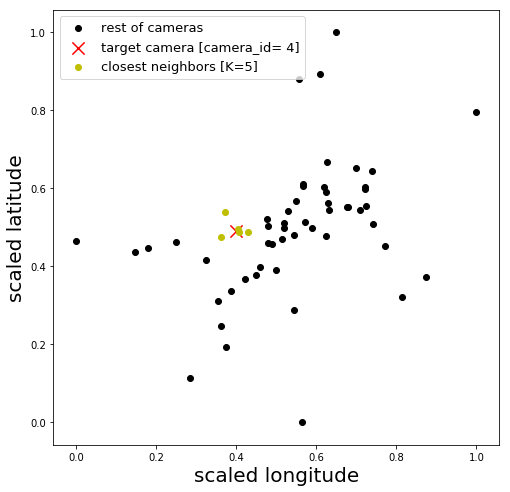

In [128]:
plot_all_cams_focus_on_one_with_K_neighbors(onedf, 0, 5, closest_cam_indices)

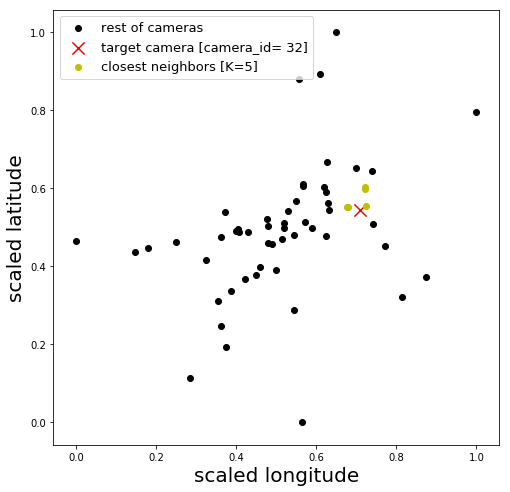

In [129]:
plot_all_cams_focus_on_one_with_K_neighbors(onedf, 10, 5, closest_cam_indices)

### Let's plot timeseries of the camera with its nearby neighbors

In [192]:
import matplotlib.dates as mdates

In [240]:
day_locator = mdates.DayLocator()
month_locator = mdates.MonthLocator()

In [286]:
def plot_timeseries(pivdf, cam_idx_to_vis):
    
    fig, axes = plt.subplots(nrows=len(cam_idx_to_vis),ncols=1,sharex=True,sharey=True,
                          figsize=(20,4* len(cam_idx_to_vis)))
    for i,_id in enumerate(cam_idx_to_vis):  
        ts = pivdf.iloc[:, _id].values
    
        axes[i].plot(ts)
        axes[i].set_ylabel("scaled density", size=20)
        axes[i].tick_params(axis='both', which='major', labelsize=16)
        axes[i].grid()
        axes[i].set_title("camera_id = {}".format(pivdf.columns[_id]), fontsize=16)
    
    plt.xlabel("30-minute time slot", size=20, labelpad=20)
    
    plt.tight_layout()
    plt.show()

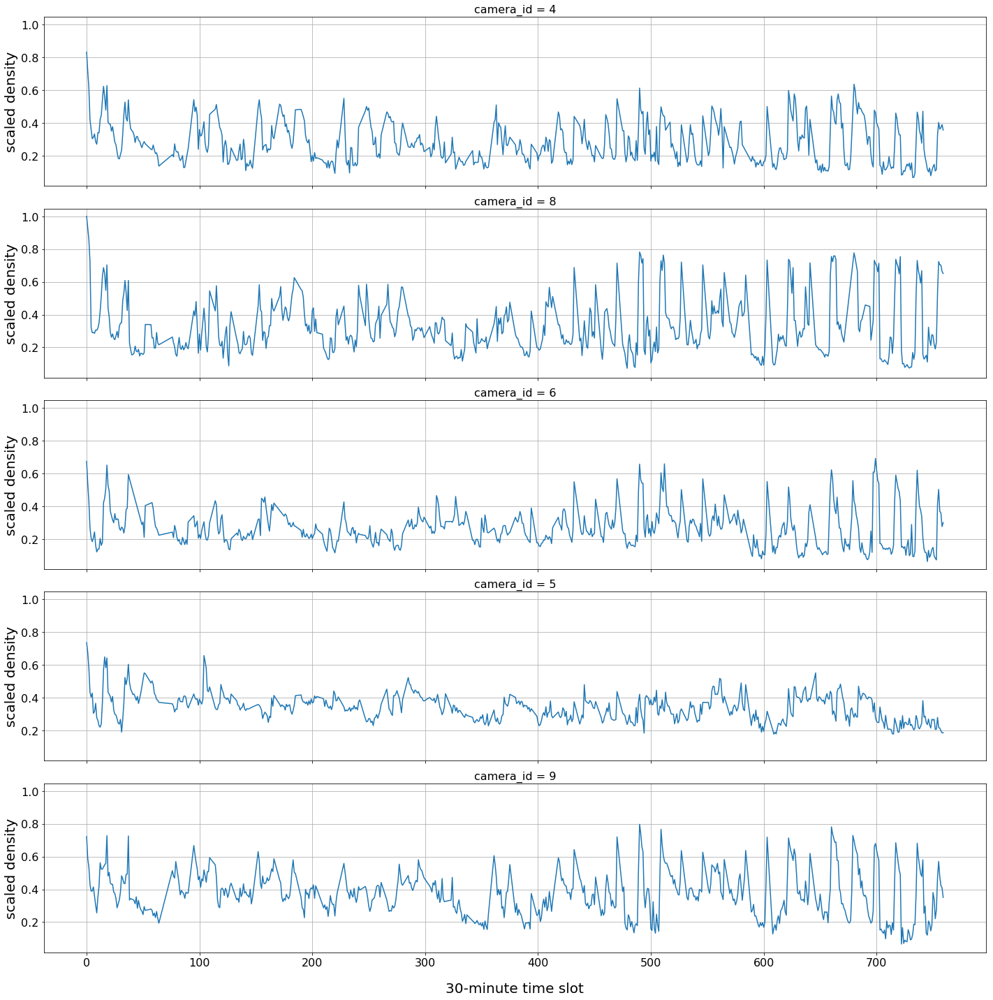

In [287]:
plot_timeseries(pivdf, closest_cam_indices[0][:5])

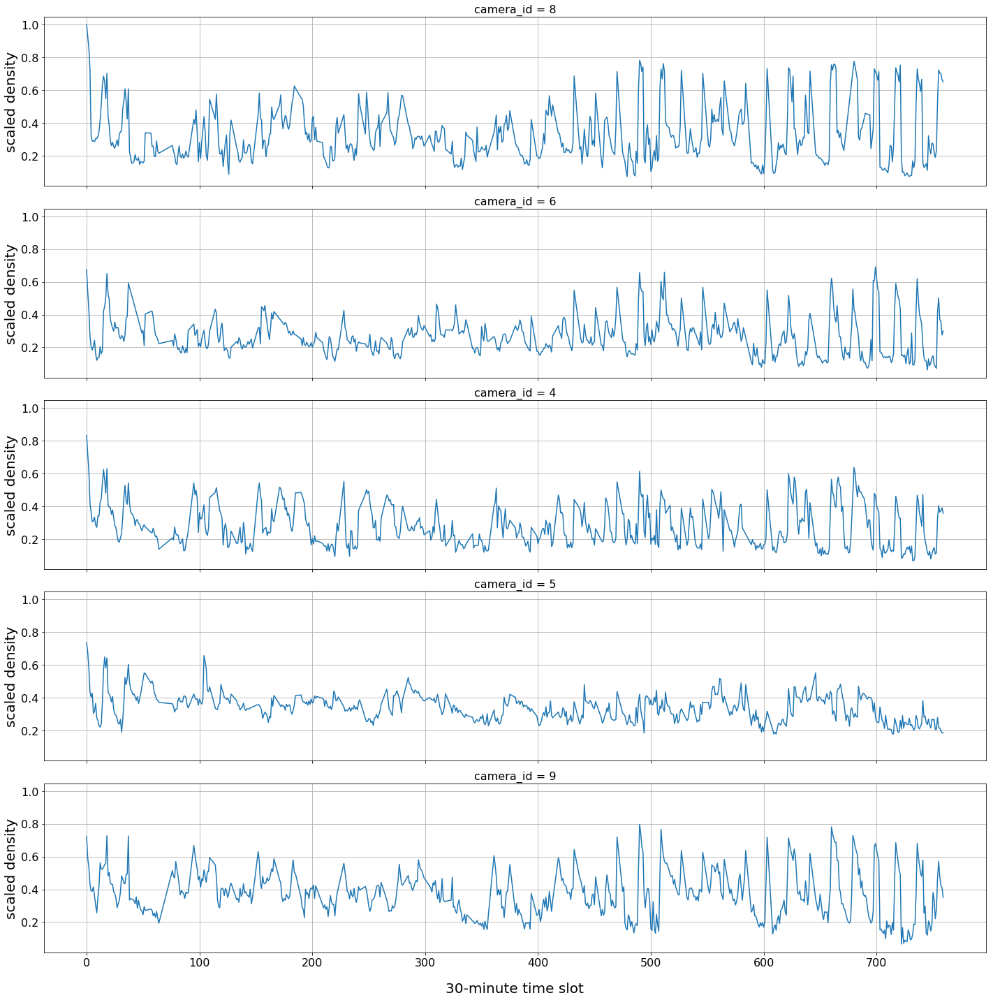

In [288]:
plot_timeseries(pivdf, closest_cam_indices[4][:5])

### Let's get autocorrelation plots of a camera

In [289]:
from pandas.plotting import autocorrelation_plot

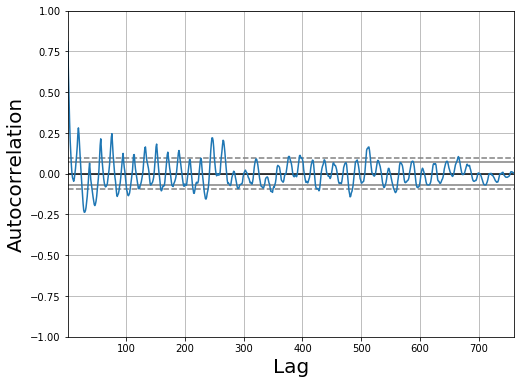

In [362]:
fig = plt.figure(figsize=(8,6))
ax = autocorrelation_plot(pivdf.iloc[:,0])
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

### Also let's see the cross correlation of the camera with its neighbors

In [370]:
# def crosscorr(ts1, ts2, lag):
#     return ts1.corr(ts2.shift(lag))
def crosscorr(ts1, ts2, lag):
    return ts1[:-lag].corr(ts2[lag:])

In [371]:
def plot_crosscorrelations(pivdf, cam_index, K, closest_cam_indices):
    
    fig, axes = plt.subplots(nrows=K,ncols=1,sharex=True,sharey=True,
                          figsize=(20,4*(K)))
    target_ts = pivdf.iloc[:,cam_index]
    for i,_id in enumerate(closest_cam_indices[cam_index][1:K+1]):  
        ts = pivdf.iloc[:, _id]
    
        axes[i].plot([target_ts.corr(ts.shift(lag)) for lag in range(500)])
        axes[i].set_ylabel("pearson correlation", size=20)
        axes[i].tick_params(axis='both', which='major', labelsize=16)
        axes[i].grid()
        axes[i].set_title("correlation of camera_id {} versus {}".format(pivdf.columns[cam_index],pivdf.columns[_id]), fontsize=16)
    
    plt.xlabel("Lag (in number of 30-minute slots)", size=20, labelpad=20)
    
    plt.tight_layout()
    plt.show()

In [384]:
def plot_crosscorrelations_custom(pivdf, cam_index, K, closest_cam_indices):
    fig, axes = plt.subplots(nrows=K,ncols=1,sharex=True,sharey=True,
                          figsize=(20,4*(K)))
    target_ts = pivdf.iloc[:,cam_index]
    for i,_id in enumerate(closest_cam_indices[cam_index][1:K+1]):  
        ts = pivdf.iloc[:, _id]
    
        axes[i].plot([crosscorr(target_ts,ts,lag) for lag in range(300)])
        axes[i].set_ylabel("pearson correlation", size=20)
        axes[i].tick_params(axis='both', which='major', labelsize=16)
        axes[i].grid()
        axes[i].set_title("correlation of camera_id {} versus {}".format(pivdf.columns[cam_index],pivdf.columns[_id]), fontsize=16)
    
    plt.xlabel("Lag (in number of 30-minute slots)", size=20, labelpad=20)
    
    plt.tight_layout()
    plt.show()

In [387]:
def plot_acf_difference(pivdf, cam_index, K, closest_cam_indices):
    fig, axes = plt.subplots(nrows=K,ncols=1,sharex=True,sharey=True,
                          figsize=(20,4*(K)))
    target_ts = pivdf.iloc[:,cam_index]
    for i,_id in enumerate(closest_cam_indices[cam_index][1:K+1]):  
        ts = pivdf.iloc[:, _id]
    
        autocorrelation_plot(target_ts - ts, ax = axes[i])
        axes[i].set_ylabel("pearson correlation", size=20)
        axes[i].tick_params(axis='both', which='major', labelsize=16)
        axes[i].grid()
        axes[i].set_title("correlation of camera_id {} versus {}".format(pivdf.columns[cam_index],pivdf.columns[_id]), fontsize=16)
    
    plt.xlabel("Lag (in number of 30-minute slots)", size=20, labelpad=20)
    
    plt.tight_layout()
    plt.show()

In [460]:
def plot_acf_ratio(pivdf, cam_index, K, closest_cam_indices):
    fig, axes = plt.subplots(nrows=K,ncols=1,sharex=True,sharey=True,
                          figsize=(20,4*(K)))
    target_ts = pivdf.iloc[:,cam_index]
    for i,_id in enumerate(closest_cam_indices[cam_index][1:K+1]):  
        ts = pivdf.iloc[:, _id]

        autocorrelation_plot(target_ts / ts, ax = axes[i])
        axes[i].set_ylabel("pearson correlation", size=20)
        axes[i].tick_params(axis='both', which='major', labelsize=16)
        axes[i].grid()
        axes[i].set_title("correlation of camera_id {} versus {}".format(pivdf.columns[cam_index],pivdf.columns[_id]), fontsize=16)
    
    plt.xlabel("Lag (in number of 30-minute slots)", size=20, labelpad=20)
    
    plt.tight_layout()
    plt.show()

In [449]:
np.sum(((pivdf.iloc[:,0] / pivdf.iloc[:,41]) - np.mean(pivdf.iloc[:,0] / pivdf.iloc[:,41]))**2) / float(len((pivdf.iloc[:,0] / pivdf.iloc[:,41])))

0.17934866585476783

In [456]:
import warnings
warnings.filterwarnings('always')

C:\Users\Roozbeh\Anaconda3\envs\spatio_temporal\lib\site-packages\pandas\plotting\_misc.py:620: RuntimeWarning: invalid value encountered in subtract
  c0 = np.sum((data - mean) ** 2) / float(n)
C:\Users\Roozbeh\Anaconda3\envs\spatio_temporal\lib\site-packages\pandas\plotting\_misc.py:624: RuntimeWarning: invalid value encountered in subtract
  (data[h:] - mean)).sum() / float(n) / c0
C:\Users\Roozbeh\Anaconda3\envs\spatio_temporal\lib\site-packages\pandas\plotting\_misc.py:624: RuntimeWarning: invalid value encountered in subtract
  (data[h:] - mean)).sum() / float(n) / c0
C:\Users\Roozbeh\Anaconda3\envs\spatio_temporal\lib\site-packages\pandas\plotting\_misc.py:624: RuntimeWarning: invalid value encountered in subtract
  (data[h:] - mean)).sum() / float(n) / c0
C:\Users\Roozbeh\Anaconda3\envs\spatio_temporal\lib\site-packages\pandas\plotting\_misc.py:624: RuntimeWarning: invalid value encountered in subtract
  (data[h:] - mean)).sum() / float(n) / c0
C:\Users\Roozbeh\Anaconda3\envs\s

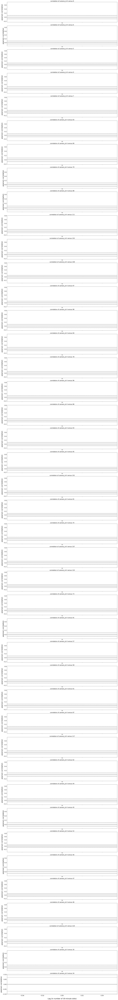

In [461]:
plot_acf_ratio(pivdf, 0, 42, closest_cam_indices)

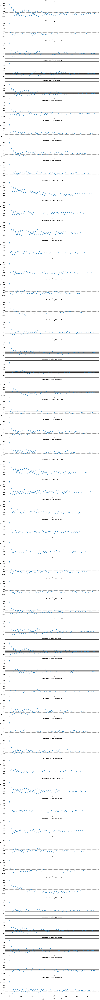

In [388]:
plot_acf_difference(pivdf, 0, 50, closest_cam_indices)

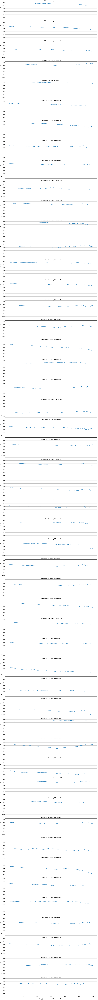

In [386]:
plot_crosscorrelations_custom(pivdf, 0, 50, closest_cam_indices)

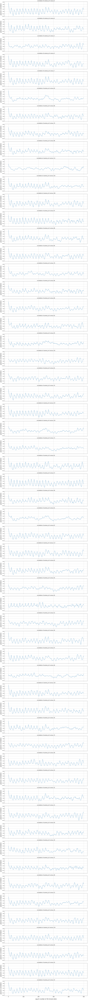

In [365]:
plot_crosscorrelations(pivdf, 0, 57, closest_cam_indices)

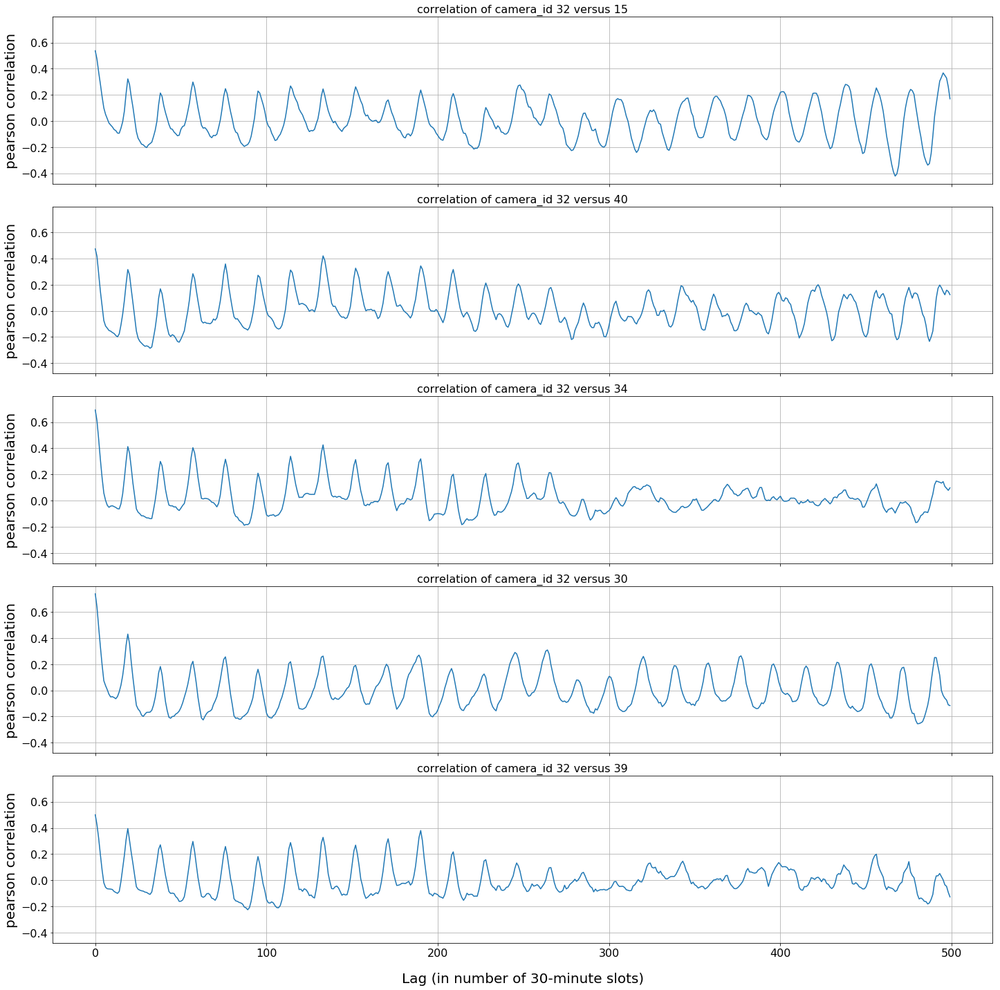

In [354]:
plot_crosscorrelations(pivdf, 10, 5, closest_cam_indices)

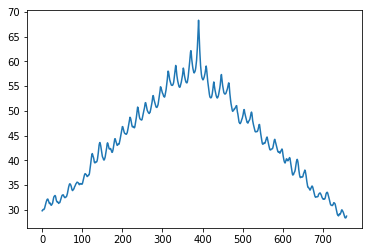

In [300]:
plt.plot(np.correlate(pivdf.iloc[:,0],pivdf.iloc[20:,0],'same'))